In [1]:
import os
import librosa
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import pandas as pd
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import AffinityPropagation
from scipy.spatial.distance import cdist
import librosa
import IPython.display as ipd
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import AgglomerativeClustering
import tensorflow as tf
from tensorflow.keras import layers, models

In [3]:
# Directory containing audio files
audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]


In [4]:
# Load the saved features
features_scaled = np.load(r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_data\features_scaled.npy')
print("Loaded features with shape:", features_scaled.shape)
selected_features = features_scaled[:,[0,1,2,3]]

Loaded features with shape: (86335, 13)


In [5]:
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(selected_features)

In [6]:


# Define the Autoencoder model
input_dim = data_scaled.shape[1]  # The number of features
encoding_dim = 2  

# Encoder
input_layer = layers.Input(shape=(input_dim,))
encoded = layers.Dense(128, activation='relu')(input_layer)
encoded = layers.Dense(64, activation='relu')(encoded)
encoded = layers.Dense(encoding_dim, activation='relu')(encoded)  # Latent space

# Decoder
decoded = layers.Dense(64, activation='relu')(encoded)
decoded = layers.Dense(128, activation='relu')(decoded)
decoded = layers.Dense(input_dim, activation='sigmoid')(decoded)  # Output layer

# Autoencoder model
autoencoder = models.Model(input_layer, decoded)

# Encoder model to extract encoded data
encoder = models.Model(input_layer, encoded)

# Compile the model
autoencoder.compile(optimizer='adam', loss='mse')

In [12]:
# Train the autoencoder model
fit_autoencoder = autoencoder.fit(data_scaled, data_scaled, epochs=50, batch_size=256, shuffle=True, validation_split=0.2)


Epoch 1/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6809 - val_loss: 0.6622
Epoch 2/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6829 - val_loss: 0.6622
Epoch 3/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6810 - val_loss: 0.6622
Epoch 4/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6873 - val_loss: 0.6622
Epoch 5/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6783 - val_loss: 0.6623
Epoch 6/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6806 - val_loss: 0.6623
Epoch 7/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6847 - val_loss: 0.6622
Epoch 8/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6810 - val_loss: 0.6623
Epoch 9/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6824 - val_loss: 0.6623
Epoch 10/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6839 - val_loss: 0.6623
Epoch 11/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6846 - val_loss: 0.6622
Epoch 12/50
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

In [17]:
# Extract validation loss per epoch
val_losses = [
    0.6622, 0.6622, 0.6622, 0.6622, 0.6623, 0.6623, 0.6622, 0.6623, 0.6623, 0.6623,
    0.6622, 0.6622, 0.6621, 0.6623, 0.6623, 0.6622, 0.6622, 0.6621, 0.6621, 0.6620,
    0.6622, 0.6623, 0.6623, 0.6622, 0.6621, 0.6622, 0.6622, 0.6624, 0.6623, 0.6622,
    0.6621, 0.6621, 0.6622, 0.6624, 0.6623, 0.6626, 0.6622, 0.6623, 0.6621, 0.6621,
    0.6621, 0.6624, 0.6622, 0.6622, 0.6622, 0.6623, 0.6622, 0.6623, 0.6621, 0.6621
]

train_losses = [
    0.6809, 0.6829, 0.6810, 0.6873, 0.6783, 0.6806, 0.6847, 0.6810, 0.6824, 0.6839,
    0.6846, 0.6806, 0.6815, 0.6766, 0.6795, 0.6827, 0.6787, 0.6853, 0.6766, 0.6786,
    0.6829, 0.6867, 0.6810, 0.6806, 0.6841, 0.6800, 0.6815, 0.6840, 0.6739, 0.6845,
    0.6821, 0.6837, 0.6766, 0.6820, 0.6763, 0.6790, 0.6799, 0.6839, 0.6876, 0.6843,
    0.6838, 0.6791, 0.6784, 0.6807, 0.6832, 0.6812, 0.6824, 0.6807, 0.6824, 0.6854
]



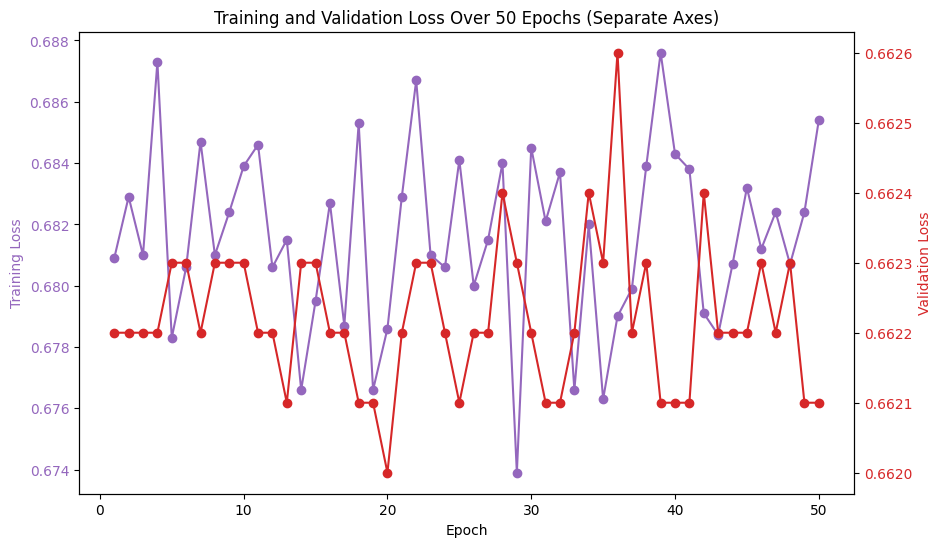

In [26]:
fig, ax1 = plt.subplots(figsize=(10, 6))

epochs = range(1, 51)

# Plot training loss on left y-axis
ax1.plot(epochs, train_losses, label='Training Loss', color='tab:purple', marker='o', linestyle='-')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Training Loss', color='tab:purple')
ax1.tick_params(axis='y', labelcolor='tab:purple')

# Create a second y-axis for validation loss
ax2 = ax1.twinx()
ax2.plot(epochs, val_losses, label='Validation Loss', color='tab:red', marker='o', linestyle='-')
ax2.set_ylabel('Validation Loss', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Title and grid
plt.title('Training and Validation Loss Over 50 Epochs (Separate Axes)')

plt.show()


In [27]:

# Get the encoded data (latent space)
encoded_data = encoder.predict(data_scaled)



2698/2698 ━━━━━━━━━━━━━━━━━━━━ 3s 808us/step


In [28]:
# Get the reconstructed data
reconstructed_data = autoencoder.predict(data_scaled)

# Compute reconstruction error (mean squared error)
reconstruction_error = np.mean(np.square(data_scaled - reconstructed_data), axis=1)


2698/2698 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


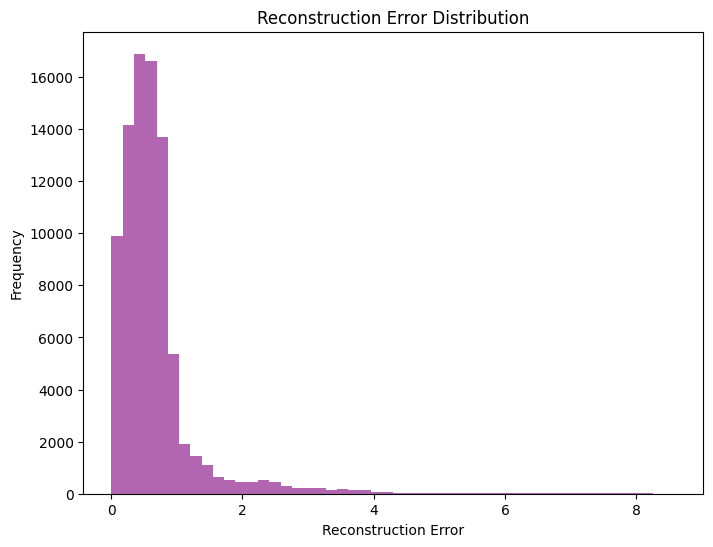

In [29]:

# Plot the reconstruction errors
plt.figure(figsize=(8, 6))
plt.hist(reconstruction_error, bins=50, color='purple', alpha=0.6)
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution')

plt.show()


In [30]:
# Decode the centroids back to the original feature space

# Extract the decoder from the autoencoder model
decoder_input = layers.Input(shape=(encoding_dim,))  # Latent space input
decoder_output = autoencoder.layers[-3](decoder_input)  # The second Dense layer in the decoder
decoder_output = autoencoder.layers[-2](decoder_output)  # The third Dense layer in the decoder
decoder_output = autoencoder.layers[-1](decoder_output)  # The output layer in the decoder

# Define the decoder model
decoder_model = models.Model(decoder_input, decoder_output)


In [31]:
from scipy.spatial.distance import cdist
import librosa
from IPython.display import display, Audio

# Function to find representative samples for centroids
def find_representative_samples(features, centroids, audio_files):
    representative_samples = []
    for centroid in centroids:
        distances = cdist([centroid], features)  # Calculate distances between centroids and feature data
        closest_idx = distances.argmin()  # Find the closest feature
        representative_samples.append(audio_files[closest_idx])  # Get the audio file corresponding to the closest feature
    return representative_samples


# Assuming the decoded centroids are audio signals (e.g., waveform)
# You might need to convert the decoded centroids to an audio format,
# depending on the type of data you're working with.
# Listen to the representative samples for each algorithm
def listen_to_representative_samples(algorithm_name, representative_samples):
    print(f"\n--- {algorithm_name} Cluster Representative Samples ---")
    for i, audio_file in enumerate(representative_samples):
        print(f"Cluster {i} representative sample: {audio_file}")
        
        # Load the audio file using librosa
        audio, sr = librosa.load(audio_file)
        
        # Display the audio for listening
        display(Audio(audio, rate=sr))



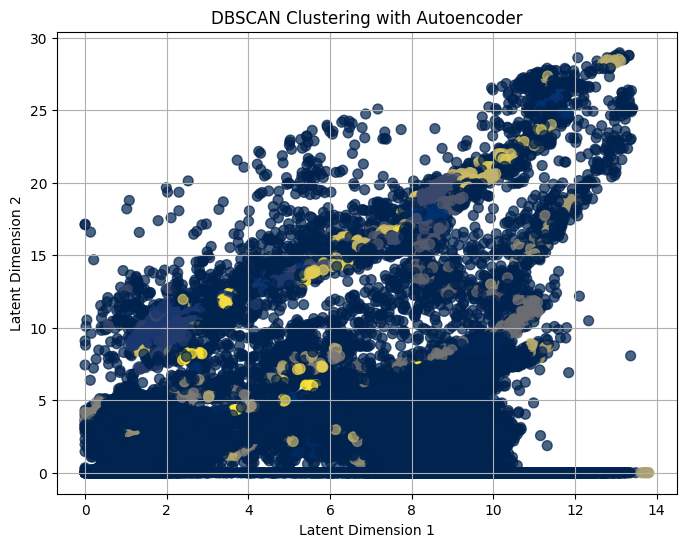

In [36]:

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score



# 1. DBSCAN clustering with lavender theme
dbscan = DBSCAN(eps=0.1, min_samples=5)
dbscan_labels = dbscan.fit_predict(encoded_data)


plt.figure(figsize=(8, 6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=dbscan_labels, cmap='cividis', s=50, alpha=0.7)
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('DBSCAN Clustering with Autoencoder')
plt.grid(True)
plt.show()


In [37]:
# 3. Calculate Silhouette Score and Calinski-Harabasz Score
# Calinski-Harabasz Score (works for all cluster numbers)
dbscan_calinski = calinski_harabasz_score(encoded_data[dbscan_labels != -1], dbscan_labels[dbscan_labels != -1]) if len(set(dbscan_labels) - {-1}) > 1 else np.nan

print(f"DBSCAN Calinski-Harabasz Score: {dbscan_calinski}")

DBSCAN Calinski-Harabasz Score: 121.52680206298828


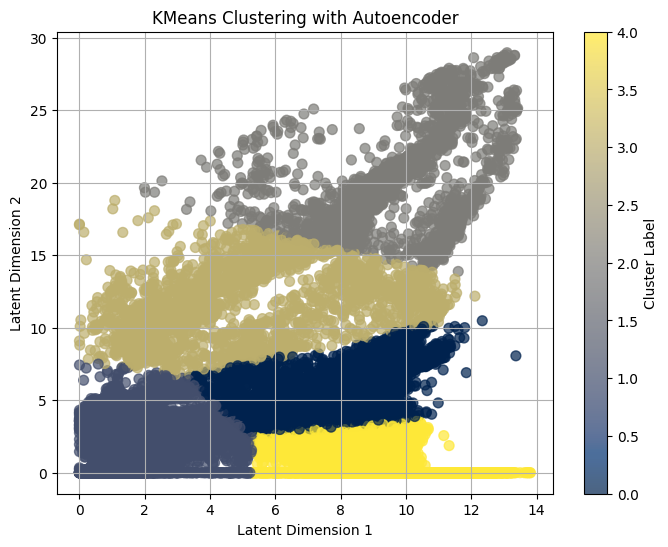

In [33]:

# 2. KMeans clustering
kmeans = KMeans(n_clusters=5, n_init=10, random_state=42)
kmeans_labels = kmeans.fit_predict(encoded_data)

plt.figure(figsize=(8, 6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=kmeans_labels, cmap='cividis', s=50, alpha=0.7)
plt.colorbar(label='Cluster Label')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('KMeans Clustering with Autoencoder')
plt.grid(True)
plt.show()


In [38]:
kmeans_calinski = calinski_harabasz_score(encoded_data, kmeans_labels)
print(f"KMeans Calinski-Harabasz Score: {kmeans_calinski}")

KMeans Calinski-Harabasz Score: 148012.9375


In [74]:
silhouette_score_kmeans = silhouette_score(encoded_data, kmeans_labels)
print(f"KMeans Silhouette Score: {silhouette_score_kmeans}")

KMeans Silhouette Score: 0.5673459768295288


In [75]:
silhouette_score_dbscan = silhouette_score(encoded_data, dbscan_labels)
print(f"DBSCAN Silhouette Score: {silhouette_score_dbscan}")

DBSCAN Silhouette Score: -0.686150312423706


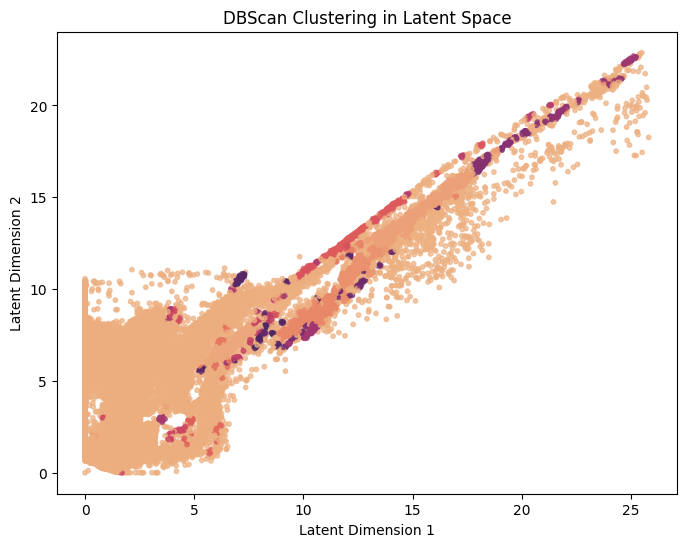

In [16]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Assuming `encoded_data` is the output of your autoencoder's encoder (the latent space)

dbscan = DBSCAN(eps=0.1, min_samples=5)
dbscan_labels = dbscan.fit_predict(encoded_data)

# Visualize the clustering in the latent space
plt.figure(figsize=(8, 6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=dbscan_labels, cmap='flare', s=10, alpha=0.7)
#plt.colorbar(label='Cluster Label')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('DBScan Clustering in Latent Space')

plt.show()


In [40]:
from sklearn.metrics import pairwise_distances

def compute_cluster_centroids(features, labels, n_clusters):
    centroids = []
    for cluster_label in range(n_clusters):
        cluster_points = features[labels == cluster_label]
        centroid = np.mean(cluster_points, axis=0)
        centroids.append(centroid)
    return np.array(centroids)

def find_most_representative_samples(features, labels, file_paths, n_samples=5):
    n_clusters = len(np.unique(labels))
    centroids = compute_cluster_centroids(features, labels, n_clusters)

    representative_samples = {}

    for cluster_label in range(n_clusters):
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = [file_paths[i] for i in cluster_indices]

        # Compute distance to centroid
        centroid = centroids[cluster_label].reshape(1, -1)
        distances = pairwise_distances(cluster_features, centroid, metric='euclidean')

        # Sort and select top 5 closest samples
        sorted_indices = np.argsort(distances.ravel())[:n_samples]
        representative_samples[cluster_label] = [cluster_files[i] for i in sorted_indices]

    return representative_samples

def plot_melspec_and_play(audio_file, ax):
    # Load audio
    y, sr = librosa.load(audio_file, sr=None)

    # Compute mel spectrogram
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    # Plot mel spectrogram
    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram\n{os.path.basename(audio_file)}', fontsize=10)

    # Play audio (for Jupyter or IPython environments)
    display(ipd.Audio(audio_file))

def display_representative_samples(features, labels, file_paths, n_samples=5):
    representative_samples = find_most_representative_samples(features, labels, file_paths, n_samples)

    for cluster_label, files in representative_samples.items():
        print(f"\nCluster {cluster_label}: Most Representative Samples")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 5), dpi=300)

        # Handle single-sample cluster case
        if len(files) == 1:
            axes = [axes]

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"Cluster {cluster_label} - Most Representative Samples", fontsize=14)
        plt.tight_layout()
        plt.show()







Cluster 0: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_3897.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_5368.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_4509.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_4505.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_4504.wav


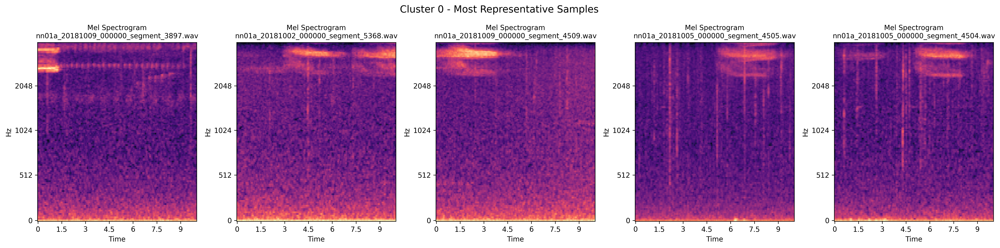


Cluster 1: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_146.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_580.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_581.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_296.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_579.wav


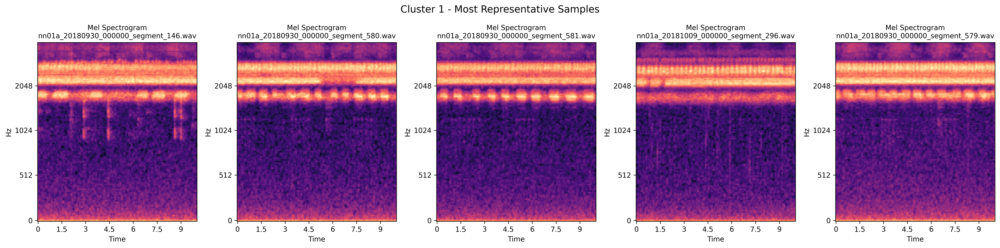


Cluster 2: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5333.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5355.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5356.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5332.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5354.wav


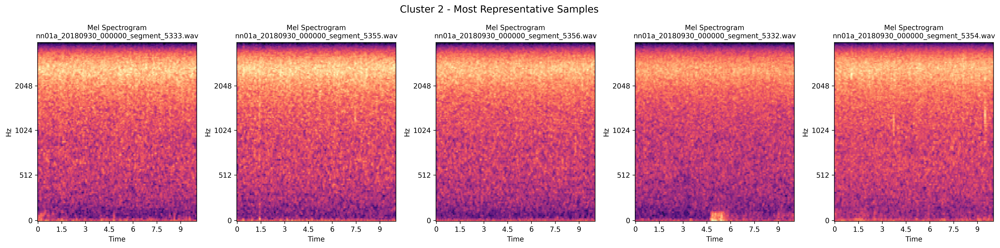


Cluster 3: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5781.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_656.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_663.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5752.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_657.wav


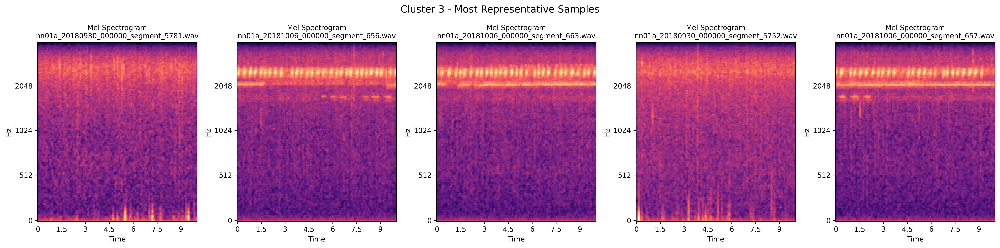


Cluster 4: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_2653.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_2839.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_6314.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_6073.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_2365.wav


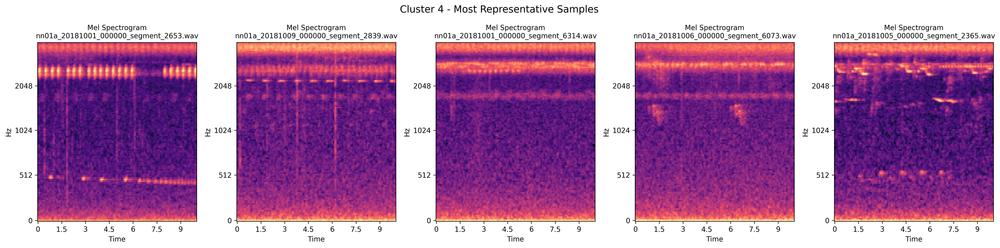

In [41]:
display_representative_samples(selected_features, kmeans_labels, audio_files)

In [47]:
selected_samples = find_most_representative_samples(selected_features, kmeans_labels, audio_files, n_samples=100)

In [67]:
def compute_shannon_index(audio, sr, n_fft=1024, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))**2
    energy_per_band = np.sum(S, axis=1)
    total_energy = np.sum(energy_per_band)
    proportions = energy_per_band / total_energy
    proportions = proportions[proportions > 0]  # Avoid log(0) errors
    shannon_index = -np.sum(proportions * np.log(proportions))
    return shannon_index

# Store results
shannon_results_kmeans = []

# Loop through each cluster and its files
for cluster_label, files in selected_samples.items():
    for file_path in files:
        audio, sr = librosa.load(file_path, sr=None)
        shannon_index = compute_shannon_index(audio, sr)

        shannon_results_kmeans.append({
            "filename": file_path,
            "cluster_label": cluster_label,
            "shannon_index": shannon_index
        })

# Convert results to DataFrame
shannon_df = pd.DataFrame(shannon_results_kmeans)

# Save results to CSV
shannon_df.to_csv("autoencoder_kmeans_shannon_indices_per_cluster.csv", index=False)

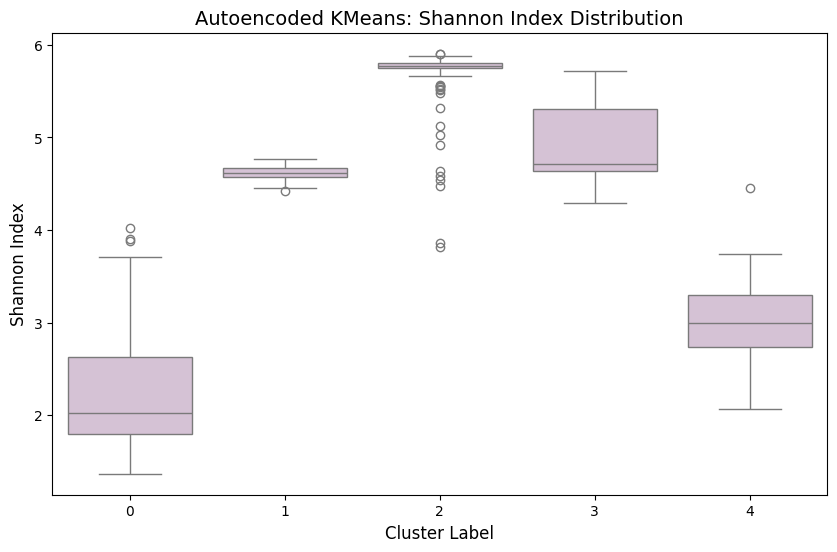

In [50]:
plt.figure(figsize=(10, 6))

# Use seaborn for color control (matplotlib boxplot itself is tricky with colors)
sns.boxplot(x='cluster_label', y='shannon_index', data=shannon_df, color='thistle')  # 'thistle' is a nice lavender

plt.title("Autoencoded KMeans: Shannon Index Distribution", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Shannon Index", fontsize=12)
plt.grid(False)
plt.show()
plt.show()

C:\Users\alina\AppData\Local\Temp\ipykernel_29924\3466386632.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')


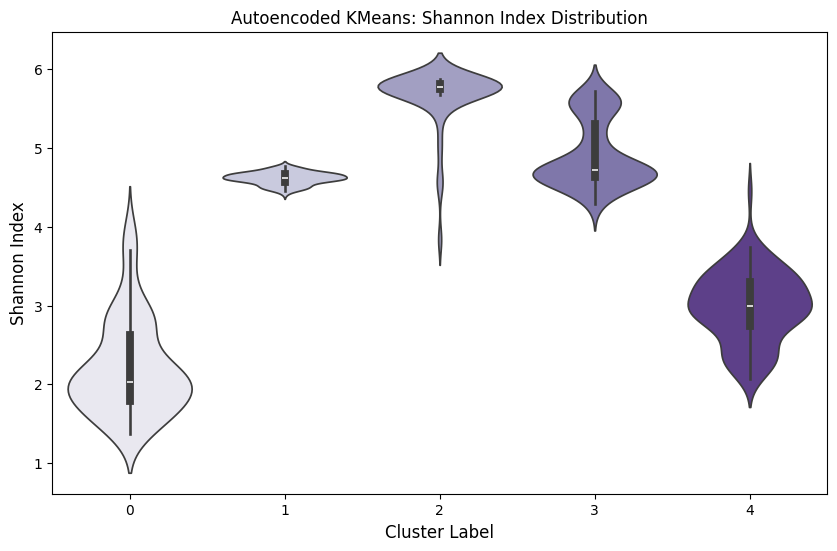

In [51]:
plt.figure(figsize=(10, 6))

sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')
plt.title('Autoencoded KMeans: Shannon Index Distribution', fontsize=12)
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Shannon Index', fontsize=12)
plt.show()

In [68]:
def compute_dbscan_cluster_centroids(features, labels):
    centroids = {}
    unique_labels = np.unique(labels)

    for cluster_label in unique_labels:
        cluster_points = features[labels == cluster_label]
        centroid = np.mean(cluster_points, axis=0)
        centroids[cluster_label] = centroid
    return centroids

def find_most_representative_dbscan_samples(features, labels, file_paths, target_clusters, n_samples=5):
    centroids = compute_dbscan_cluster_centroids(features, labels)

    representative_samples = {}

    for cluster_label in target_clusters:
        if cluster_label not in centroids:
            print(f"Warning: Cluster {cluster_label} does not exist. Skipping.")
            continue
        
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = [file_paths[i] for i in cluster_indices]

        # Compute distance to centroid
        centroid = centroids[cluster_label].reshape(1, -1)
        distances = pairwise_distances(cluster_features, centroid, metric='euclidean')

        # Sort and select top 5 closest samples
        sorted_indices = np.argsort(distances.ravel())[:n_samples]
        representative_samples[cluster_label] = [cluster_files[i] for i in sorted_indices]

    return representative_samples


def plot_melspec_and_play(audio_file, ax):
    # Load audio
    y, sr = librosa.load(audio_file, sr=None)

    # Compute mel spectrogram
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    # Plot mel spectrogram
    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram\n{os.path.basename(audio_file)}', fontsize=10)

    # Play audio (for Jupyter or IPython environments)
    display(ipd.Audio(audio_file))

def display_representative_dbscan_samples(features, labels, file_paths, target_clusters=None, n_samples=5):
    # Default to all clusters if target_clusters not provided
    if target_clusters is None:
        target_clusters = [label for label in np.unique(labels) if label != -1]

    representative_samples = find_most_representative_dbscan_samples(features, labels, file_paths, target_clusters, n_samples)

    for cluster_label, files in representative_samples.items():
        print(f"\nDBSCAN Cluster {cluster_label}: Most Representative Samples")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 4), dpi=150)

        if len(files) == 1:
            axes = [axes]

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"DBSCAN Cluster {cluster_label} - Most Representative Samples", fontsize=14)
        plt.tight_layout()
        plt.show()



DBSCAN Cluster 7: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181003_000000_segment_1995.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181003_000000_segment_1990.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_6308.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_1150.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_1147.wav


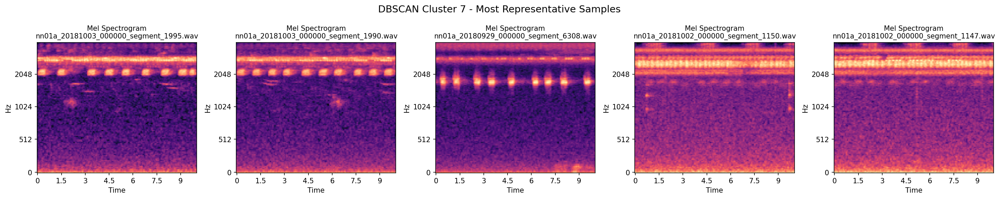


DBSCAN Cluster 35: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5172.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5130.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5154.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_7981.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_8098.wav


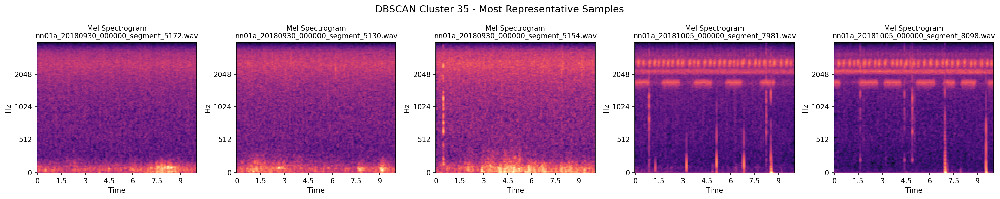


DBSCAN Cluster 56: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_67.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_60.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_244.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5516.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_7544.wav


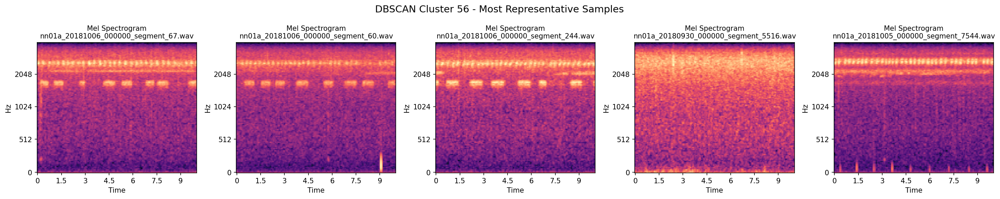


DBSCAN Cluster 75: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5871.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5874.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5872.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5870.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5869.wav


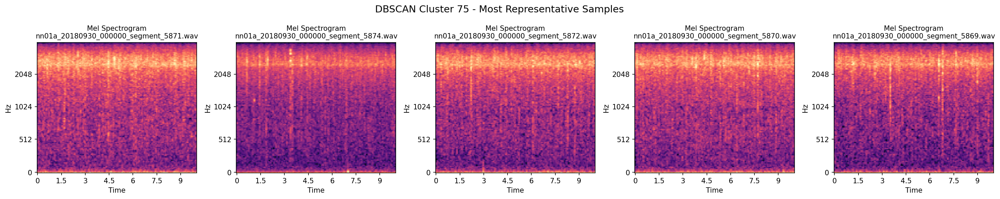

In [69]:
selected_samples = find_most_representative_dbscan_samples(selected_features, dbscan_labels, audio_files, [7, 35, 56, 75], n_samples = 5)
display_representative_dbscan_samples(selected_features, dbscan_labels, audio_files, target_clusters=[7, 35, 56, 75])

In [70]:
# Store results
shannon_results_dbscan = []

# Loop through each cluster and its files
for cluster_label, files in selected_samples.items():
    for file_path in files:
        audio, sr = librosa.load(file_path, sr=None)
        shannon_index = compute_shannon_index(audio, sr)

        shannon_results_dbscan.append({
            "filename": file_path,
            "cluster_label": cluster_label,
            "shannon_index": shannon_index
        })

# Convert results to DataFrame
shannon_df_dbscan = pd.DataFrame(shannon_results_dbscan)

# Save results to CSV
shannon_df_dbscan.to_csv("autoencoded_dbscan_shannon_indices_per_cluster.csv", index=False)

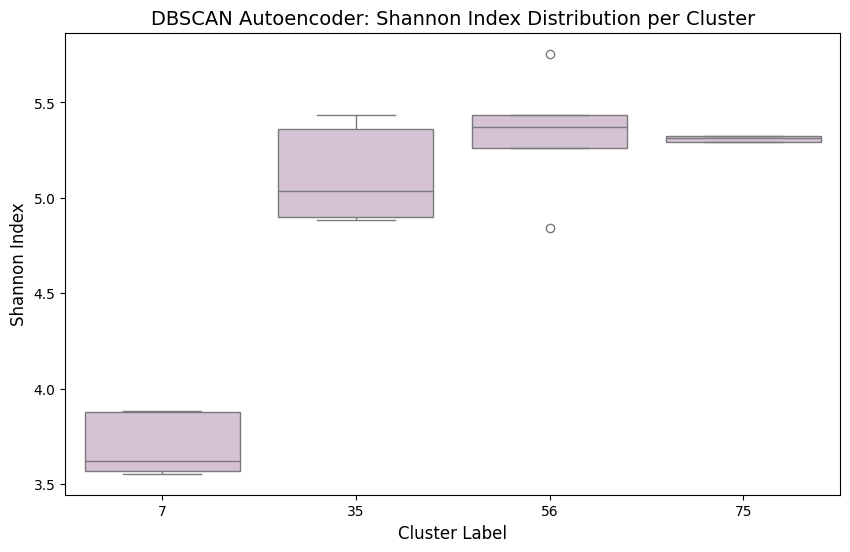

In [71]:
plt.figure(figsize=(10, 6))

# Use seaborn for color control (matplotlib boxplot itself is tricky with colors)
sns.boxplot(x='cluster_label', y='shannon_index', data=shannon_df_dbscan, color='thistle')  # 'thistle' is a nice lavender

plt.title("DBSCAN Autoencoder: Shannon Index Distribution per Cluster", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Shannon Index", fontsize=12)
plt.grid(False)
plt.show()
plt.show()

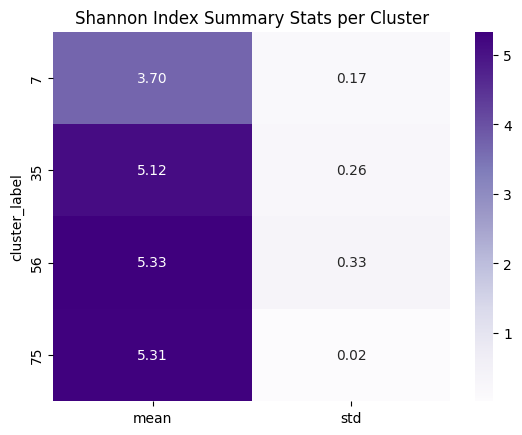

In [72]:
summary = shannon_df_dbscan.groupby('cluster_label')['shannon_index'].agg(['mean', 'std']).reset_index()
sns.heatmap(summary.set_index('cluster_label'), annot=True, cmap='Purples', fmt=".2f")
plt.title("Shannon Index Summary Stats per Cluster")
plt.show()


C:\Users\alina\AppData\Local\Temp\ipykernel_29924\1297231512.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df_dbscan, palette='Purples')


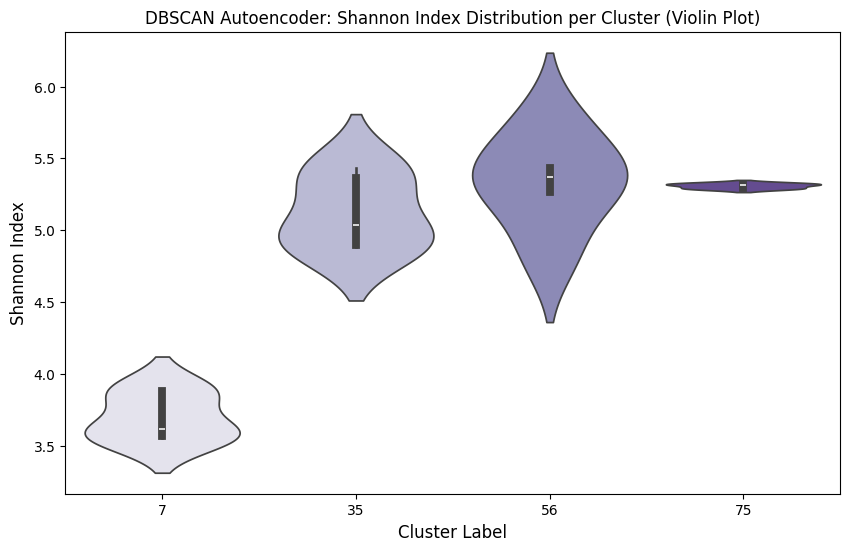

In [73]:
plt.figure(figsize=(10, 6))

sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df_dbscan, palette='Purples')
plt.title('DBSCAN Autoencoder: Shannon Index Distribution per Cluster (Violin Plot)', fontsize=12)
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Shannon Index', fontsize=12)
plt.show()

# Directory containing audio files
audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]

import numpy as np

# Calculate the centroids of the clusters in the latent space
centroids = np.array([encoded_data[encoded_labels == i].mean(axis=0) for i in np.unique(encoded_labels)])


# Now use the decoder to predict the decoded centroids
decoded_centroids = decoder_model.predict(centroids)

# Example usage:
# Assuming you have the `decoded_centroids` and `audio_files` loaded
# and `data_scaled` as your feature data (MFCCs or audio features)

# Find representative samples for each cluster using the original feature space (data_scaled) and centroids
representative_samples = find_representative_samples(data_scaled, decoded_centroids, audio_files)

# Listen to the representative samples for each algorithm
listen_to_representative_samples("Autoencoder", representative_samples)

